# Face Mask Detection using YOLO5

## Step 1: Import the required libraries

In [ ]:
import xml.etree.ElementTree as ET
import os
from sklearn.model_selection import train_test_split
import shutil
import tqdm
from datetime import datetime
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
import seaborn as sns
%matplotlib inline
from sklearn.preprocessing import LabelEncoder




In [ ]:
!pip install wandb
!wandb disabled

     |████████████████████████████████| 1.8 MB 4.2 MB/s 
     |████████████████████████████████| 181 kB 61.9 MB/s 
     |████████████████████████████████| 144 kB 65.8 MB/s 
     |████████████████████████████████| 63 kB 1.1 MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=a92c3e1373241dabb1344db2e545545c7cd66cdd36a5c0f95e68923f3bd2d8a5
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built pathtools
W&B disabled.


## Step 2: Clone and install YOLOv5 and its dependencies

In [ ]:
# Clone YOLOv5 Repo
!git clone https://github.com/ultralytics/yolov5
# Change the directory to yolo5
%cd yolov5
# Install the Requirements
!pip install -qr requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 12783, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 12783 (delta 0), reused 0 (delta 0), pack-reused 12782
Receiving objects: 100% (12783/12783), 11.75 MiB | 11.28 MiB/s, done.
Resolving deltas: 100% (8919/8919), done.
/content/yolov5
     |████████████████████████████████| 596 kB 4.1 MB/s 


### Step 3: Data Preparation

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set the paths to annotation path, images path, and processed annotation path:
anno_path = "/content/drive/MyDrive/Colab Notebooks/DL_Project/Project_DL/3_YOLO5_Face_Mask_Detection/archive/annotations"
im_path = "/content/drive/MyDrive/Colab Notebooks/DL_Project/Project_DL/3_YOLO5_Face_Mask_Detection/archive/images"
out_anno_path ="/content/drive/MyDrive/Colab Notebooks/DL_Project/Project_DL/3_YOLO5_Face_Mask_Detection/annotaions_yolo"
sample_test_path = '/content/drive/MyDrive/Colab Notebooks/DL_Project/Project_DL/1_MTCNN_Face_Mask_Detection/Test_Images'

In [ ]:
seed = 42
num_classes = 4
num_queries = 20
null_class_coef = 0.2
BATCH_SIZE = 32
LR = 2e-5
EPOCHS = 50
ANNOT_DIR = anno_path
#device = torch.device('cuda')

def get_objects(xml_file):
    annotation = ET.parse(xml_file)
    root = annotation.getroot()
    
    name = os.path.basename(xml_file).replace('.xml','')
    size = root.find('size')
    
    objects = []
    for obj in root.findall('object'):
        bbox = obj.find('bndbox')
        new_object = {}
        new_object['image_id'] = name
        new_object['labels'] = obj.find('name').text
        new_object['width'] = int(size.find('width').text)
        new_object['height'] = int(size.find('height').text)
        new_object['x'] = int(bbox.find('xmin').text)
        new_object['y'] = int(bbox.find('ymin').text)
        new_object['w'] = int(bbox.find('xmax').text)-int(bbox.find('xmin').text)
        new_object['h'] = int(bbox.find('ymax').text)-int(bbox.find('ymin').text)
        objects.append(new_object)
    return objects

In [ ]:
annots = []
for xml in os.listdir(ANNOT_DIR):
    annots += get_objects(os.path.join(ANNOT_DIR,xml))
df = pd.DataFrame(annots)

# Adjust w, h
for i in df.index:
    exceed_w =  df.iloc[i].x + df.iloc[i].w - df.iloc[i].width
    exceed_h =  df.iloc[i].y + df.iloc[i].h - df.iloc[i].height
    if exceed_w > 0:
        df.loc[df.index == i,'w'] -= exceed_w
    if exceed_h > 0:
        df.loc[df.index == i,'h'] -= exceed_h

encoder = LabelEncoder()
df.labels = encoder.fit_transform(df.labels)

df.head()

,image_id,labels,width,height,x,y,w,h
0,maksssksksss10,1,301,400,98,267,96,116
1,maksssksksss108,1,400,225,155,29,25,22
2,maksssksksss108,1,400,225,206,35,22,23
3,maksssksksss108,1,400,225,332,67,14,14
4,maksssksksss108,1,400,225,362,68,14,14


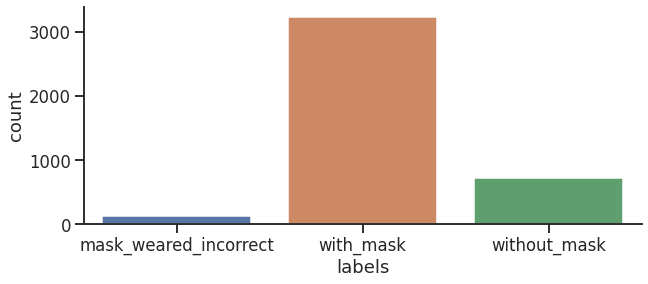

In [ ]:
plt.figure(figsize=(10, 4))
g = sns.countplot(x='labels',data=df)
g.set_xticklabels(encoder.classes_);

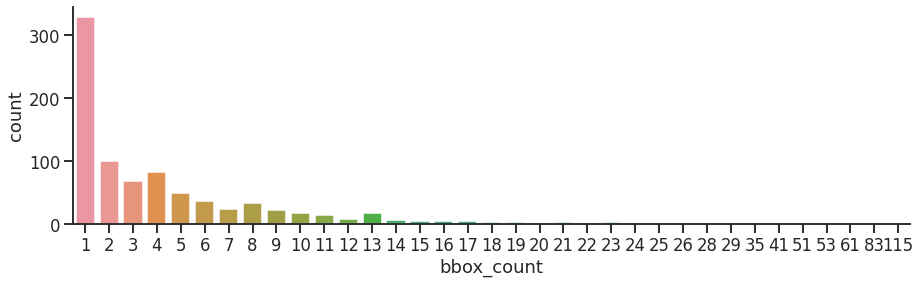

In [ ]:
df_split = df[['image_id']].copy()
# df_split = pd.concat([df_split,pd.get_dummies(df.labels).astype('int32')],axis=1)
df_split['bbox_count'] = 1
df_split = df_split.groupby('image_id').sum()

g = plt.figure(figsize=(15,4))
g = sns.countplot(x='bbox_count',data=df_split)

In [ ]:
# Split the dataset into training, validation, and testing sets
train_files1, test_files1 = train_test_split(df_split, test_size=0.2, random_state=1337)
val_files1, test_files1 =  train_test_split(test_files1, test_size=0.5, random_state=1337)

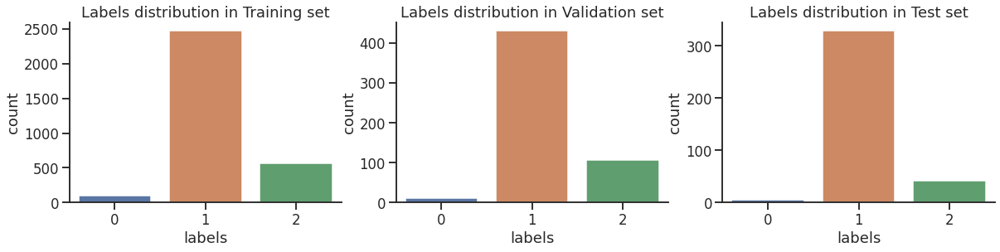

In [ ]:
fig, axs = plt.subplots(1,3,figsize=(20,4))
sns.countplot(x='labels',data=df[df['image_id'].isin(train_files1.index)],ax=axs[0])
axs[0].set_title('Labels distribution in Training set')
sns.countplot(x='labels',data=df[df['image_id'].isin(val_files1.index)],ax=axs[1])
axs[1].set_title('Labels distribution in Validation set')
sns.countplot(x='labels',data=df[df['image_id'].isin(test_files1.index)],ax=axs[2])
axs[2].set_title('Labels distribution in Test set');

In [ ]:
# Functions to process the annotations
def convert_bbox(box, img_size):
    dw = 1. / (img_size[0])
    dh = 1. / (img_size[1])
    x = (box[0] + box[1]) / 2.0
    y = (box[2] + box[3]) / 2.0
    w = box[1] - box[0]
    h = box[3] - box[2]
    x = round(x * dw, 6)
    w = round(w * dw, 6)
    y = round(y * dh, 6)
    h = round(h * dh, 6)
    return (x,y,w,h)

def convert_ann(xml_path, yolo_path):
    file_in = open(xml_path, 'r')
    tree = ET.parse(file_in)
    
    has_label = False
    file_out = open(yolo_path, 'w')
    for ele in tree.iter():
        if 'size' in ele.tag:
            img_w = int(ele.find('width').text)
            img_h = int(ele.find('height').text)
            
        if 'object' in ele.tag:
            has_label = True
            name = ele.find('name').text
            class_id = CLASSES.index(name)
            xml_box = ele.find('bndbox')
            bbox = (float(xml_box.find('xmin').text),
                    float(xml_box.find('xmax').text),
                    float(xml_box.find('ymin').text),
                    float(xml_box.find('ymax').text))
            bbox = convert_bbox(bbox, (img_w, img_h))
            file_out.write(str(class_id) + ' ' + ' '.join([str(s) for s in bbox]) + '\n')
             
    if not has_label:
        print(xml_path)
        
    file_in.close()
    file_out.close()

In [ ]:
CLASSES = ['with_mask', 'without_mask', 'mask_weared_incorrect']

In [ ]:
# Extract the bounding boxes from xml files and store them in txt files 

xml_files = os.listdir(anno_path)
for xml_file in xml_files:
    yolo_file = xml_file.split('.')[0] + '.txt'
    convert_ann(os.path.join(anno_path, xml_file), os.path.join(out_anno_path, yolo_file))

### Split the dataset into training, validation, and testing sets

In [ ]:
print('Number of total annotation files =',len(os.listdir(out_anno_path)))
print('Number of total images =',len(os.listdir(im_path)))

Number of total annotation files = 853
Number of total images = 853


In [ ]:
# Split the dataset into training, validation, and testing sets
train_files, test_files = train_test_split(os.listdir(im_path), test_size=0.2, random_state=1337)
val_files, test_files =  train_test_split(test_files, test_size=0.5, random_state=1337)

In [ ]:
print('Number of Train Files      =', len(train_files))
print('Number of Validation Files =', len(val_files))
print('Number of Test Files       =', len(test_files))

Number of Train Files      = 682
Number of Validation Files = 85
Number of Test Files       = 86


In [ ]:
sample_test_im = os.listdir(sample_test_path)

In [ ]:
!mkdir Face_Masks_Data
%ls

CONTRIBUTING.md  export.py         models/            train.py
data/            Face_Masks_Data/  README.md          tutorial.ipynb
detect.py        hubconf.py        requirements.txt*  utils/
Dockerfile       LICENSE           setup.cfg          val.py


In [ ]:
!mkdir -p Face_Masks_Data/train/images
!mkdir -p Face_Masks_Data/train/labels
!mkdir -p Face_Masks_Data/val/images
!mkdir -p Face_Masks_Data/val/labels
!mkdir -p Face_Masks_Data/test/images
!mkdir -p Face_Masks_Data/test/labels
!mkdir -p Face_Masks_Data/test/sample_test

In [ ]:
!mkdir -p Face_Masks_Data/sample_test/images

In [ ]:
def move_files(files, type='train'):
    for file in tqdm.tqdm(files):
        img_src = os.path.join(im_path, file)
        ann_src = os.path.join(out_anno_path, file.split('.')[0] + '.txt')
        img_dst = 'Face_Masks_Data/' + type +'/images/' + file
        ann_dst = 'Face_Masks_Data/' + type +'/labels/' + file.split('.')[0] + '.txt'
        shutil.copy(img_src, img_dst)
        shutil.copy(ann_src, ann_dst)
    print('Complete move', type, 'files')

In [ ]:
def move_files1(files, type='train'):
    for file in tqdm.tqdm(files):
        img_src = os.path.join(sample_test_path, file)
        img_dst = 'Face_Masks_Data/' + type +'/images/' + file
        shutil.copy(img_src, img_dst)
    print('Complete move', type, 'files')

In [ ]:
move_files(train_files, 'train')
move_files(test_files, 'test')
move_files(val_files, 'val')

In [ ]:
move_files1(sample_test_im, 'sample_test')

100%|██████████| 16/16 [00:09<00:00,  1.70it/s]

Complete move sample_test files


### Model Setup

Data file:

In [ ]:
yaml_text = """
train: Face_Masks_Data/train/images
val: Face_Masks_Data/val/images

nc: 3
names: ['with_mask', 'without_mask', 'incorrect_mask']
"""

In [ ]:
with open("Face_Masks_Data.yaml", 'w') as f:
    f.write(yaml_text)

In [ ]:
%cat Face_Masks_Data.yaml


train: Face_Masks_Data/train/images
val: Face_Masks_Data/val/images

nc: 3
names: ['with_mask', 'without_mask', 'incorrect_mask']


### 4. Train the model with pretrained weights

In [ ]:
start = datetime.now()
!python train.py --img 640 --batch 16 --epochs 100 --data Face_Masks_Data.yaml --weights yolov5m.pt
end = datetime.now()
print('Trainine time:', end - start)

wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5m.pt, cfg=, data=Face_Masks_Data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-124-g8c420c4 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, war

In [ ]:
def plot_results(res_path):
  plt.figure(figsize=(20, 20))
  img = plt.imread(res_path)
  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])
  plt.show()

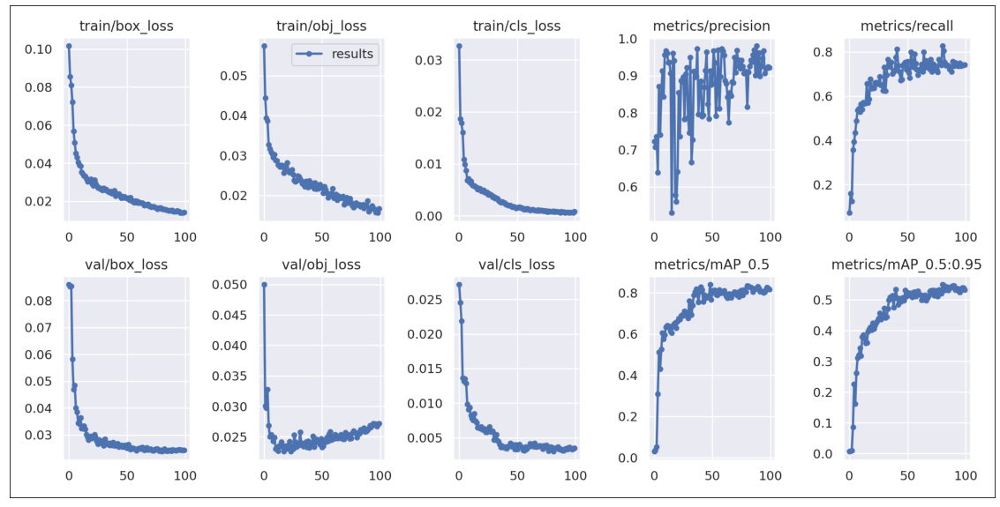

In [ ]:
res_path = 'runs/train/exp/results.png'
plot_results(res_path)

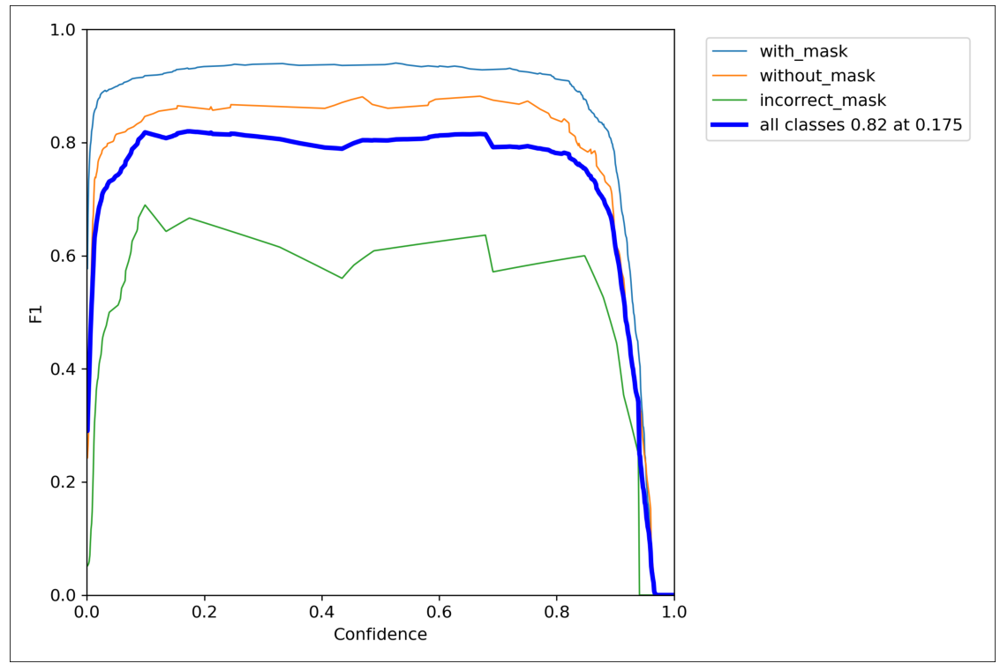

In [ ]:
res_path = '/content/yolov5/runs/train/exp/F1_curve.png'
plot_results(res_path)

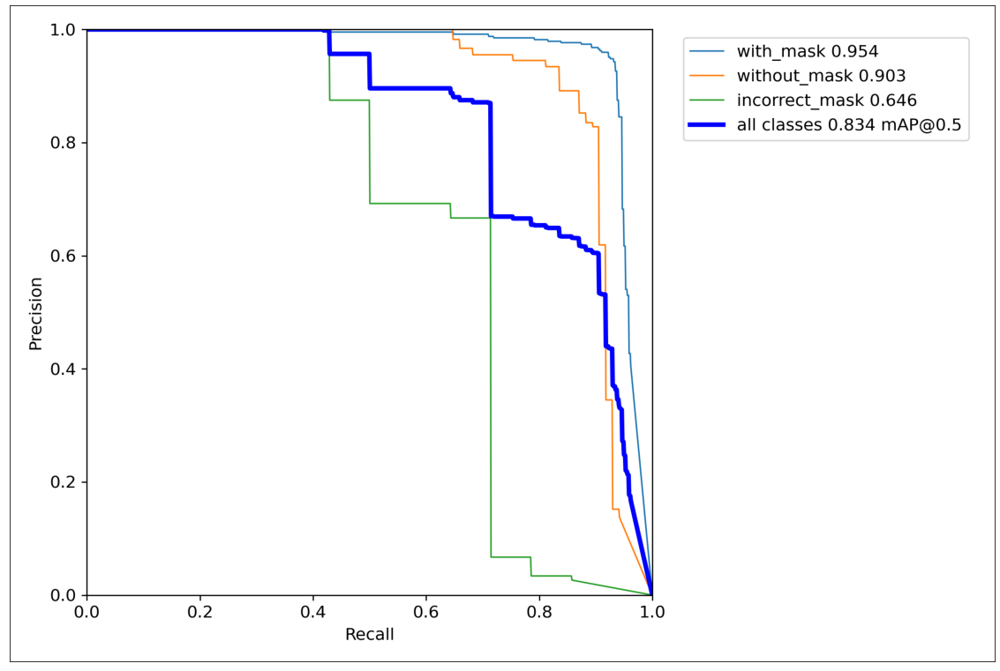

In [ ]:
res_path = '/content/yolov5/runs/train/exp/PR_curve.png'
plot_results(res_path)

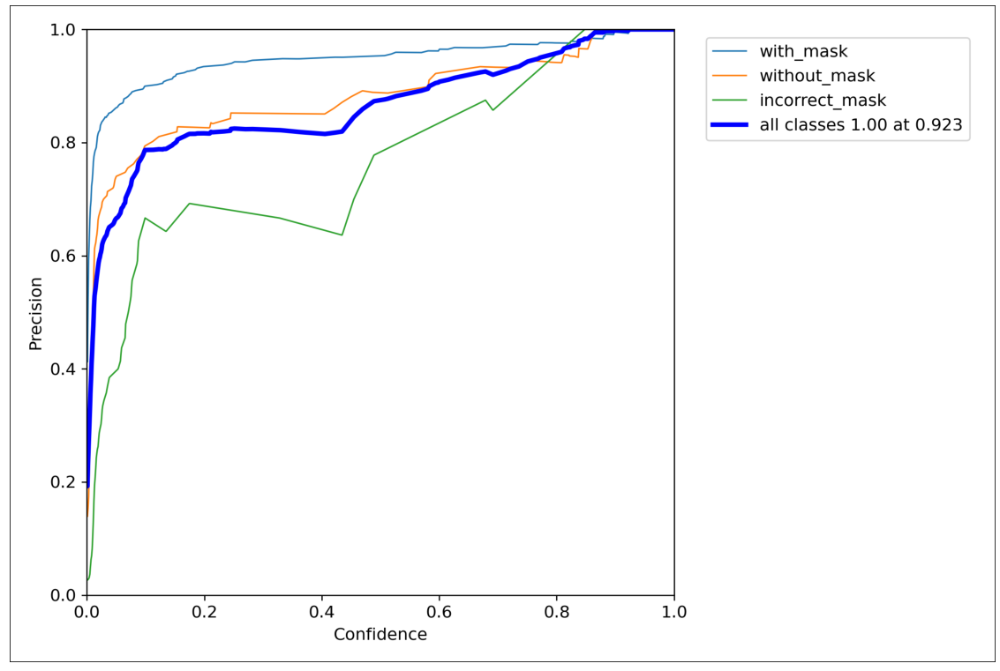

In [ ]:
res_path = '/content/yolov5/runs/train/exp/P_curve.png'
plot_results(res_path)

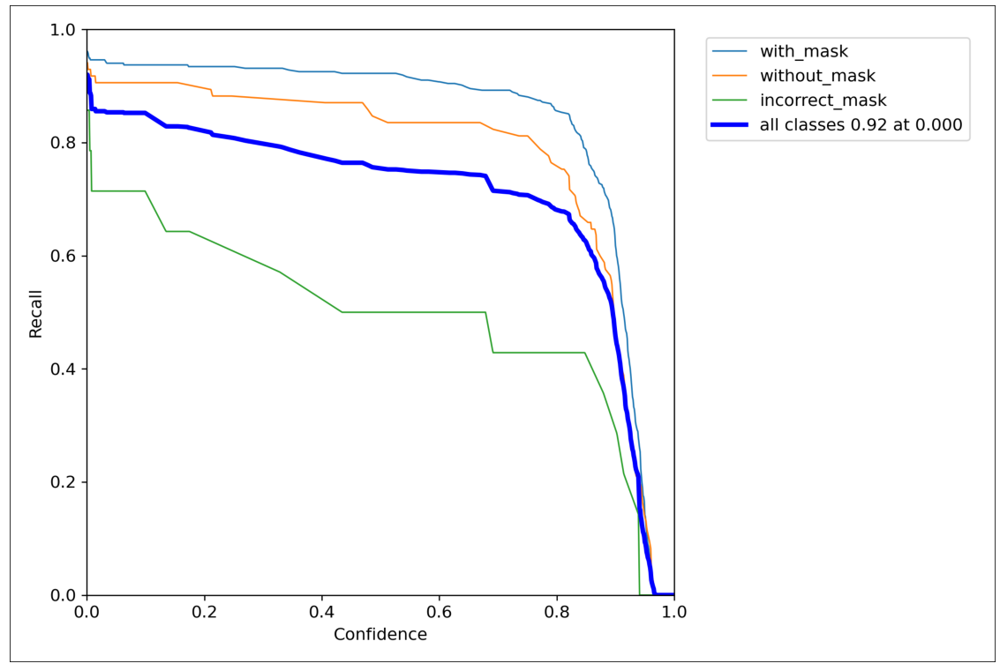

In [ ]:
res_path = '/content/yolov5/runs/train/exp/R_curve.png'
plot_results(res_path)

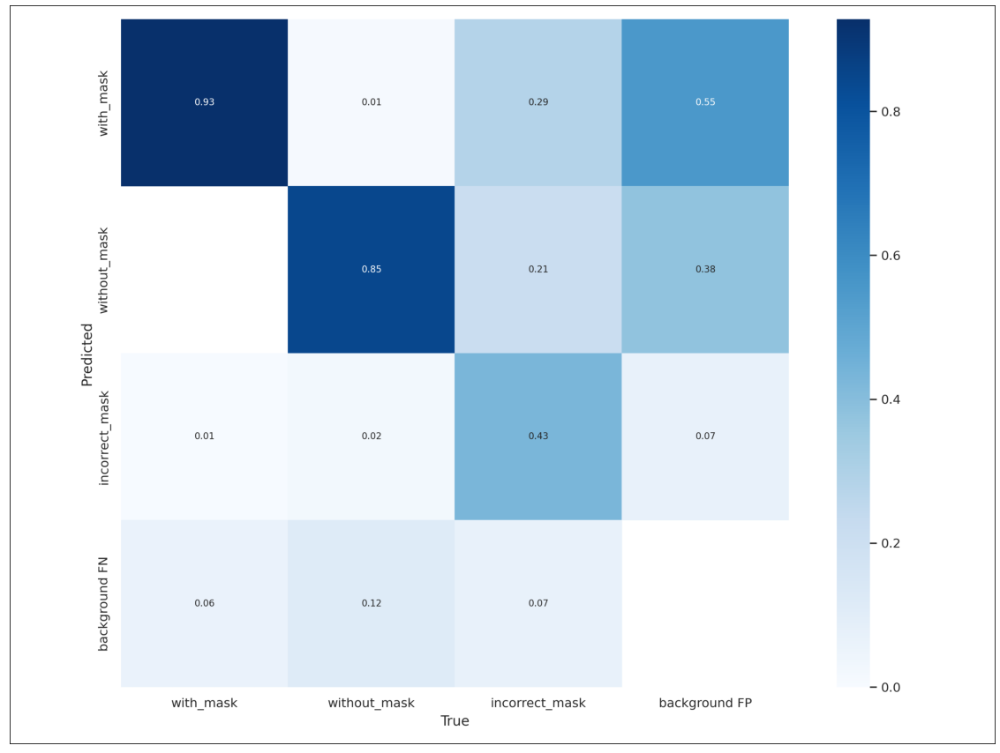

In [ ]:
res_path = '/content/yolov5/runs/train/exp/confusion_matrix.png'
plot_results(res_path)

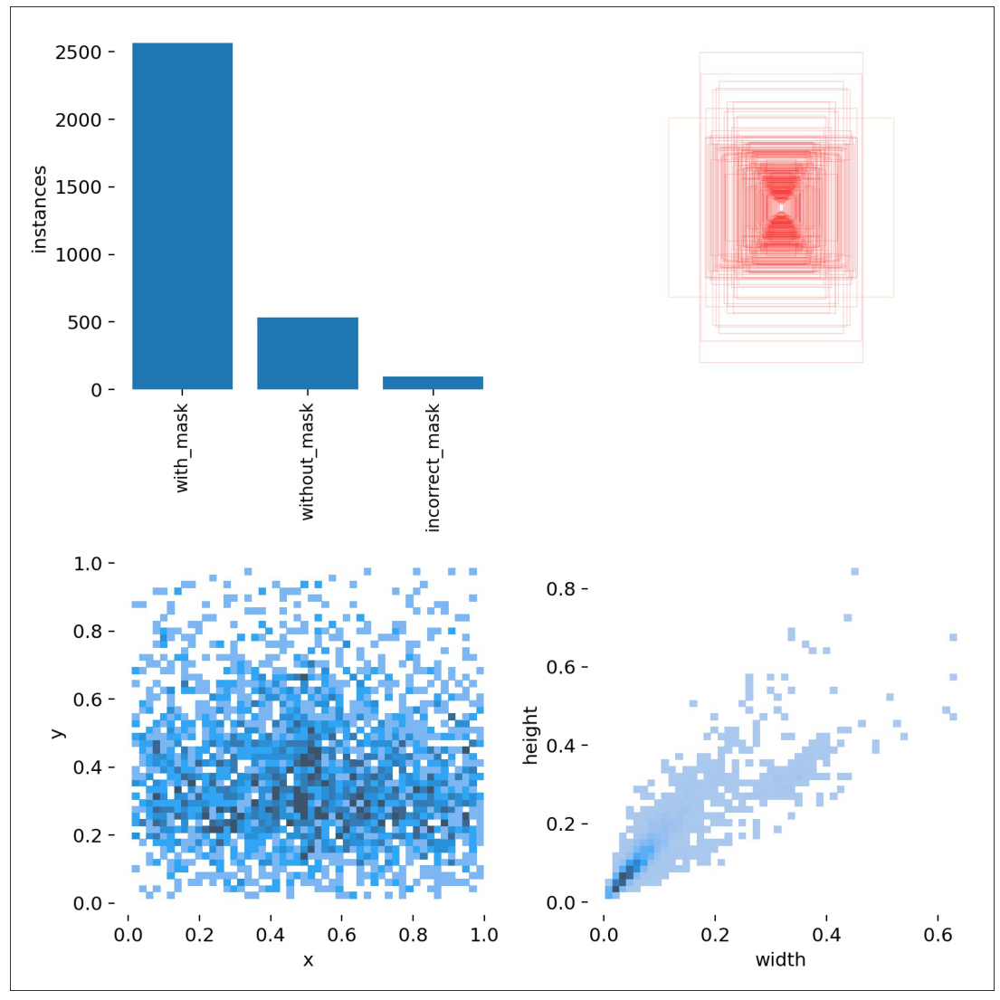

In [ ]:
res_path = '/content/yolov5/runs/train/exp/labels.jpg'
plot_results(res_path)

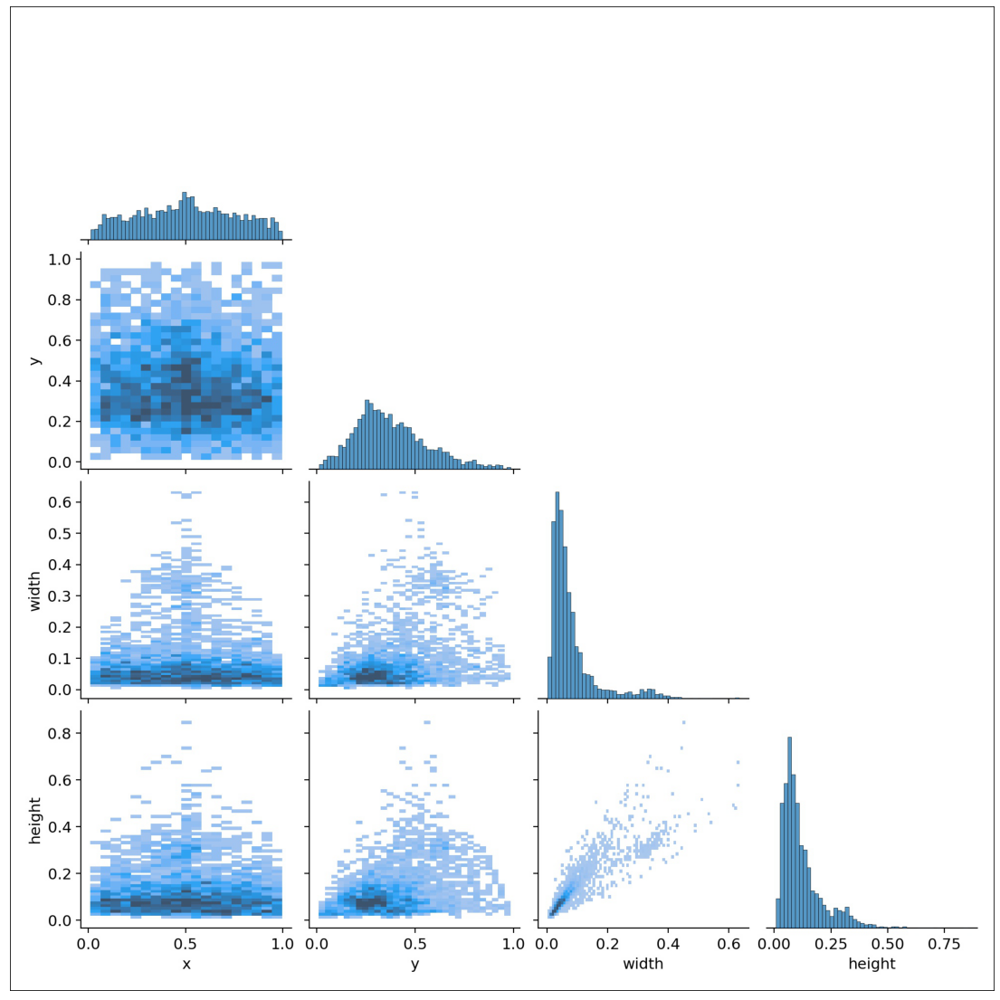

In [ ]:
res_path = '/content/yolov5/runs/train/exp/labels_correlogram.jpg'
plot_results(res_path)

### Prediction

Using the trained model
Now we have our model trained with the Labeled Mask dataset, it is time to get some predictions. This can be easily done using an out-of-the-box YOLOv5 script specially designed for this:

In [ ]:
def show_images(path, num=16):
    cnt = 0
    for file in os.listdir(path):
        img = plt.imread(os.path.join(path, file))
        plt.figure(figsize=(20, 20))
        plt.imshow(img)
        if cnt == num:
            break
        plt.xticks([])
        plt.yticks([])
        plt.show()
        cnt += 1

In [ ]:
!python detect.py --source Face_Masks_Data/sample_test/images/ --weight runs/train/exp/weights/best.pt --img 600 --conf 0.25 --line-thickness 1;

detect: weights=['runs/train/exp/weights/best.pt'], source=Face_Masks_Data/sample_test/images/, data=data/coco128.yaml, imgsz=[600, 600], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-124-g8c420c4 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 290 layers, 20861016 parameters, 0 gradients, 48.0 GFLOPs
image 1/16 /content/yolov5/Face_Masks_Data/sample_test/images/960x0.jpg: 416x608 6 with_masks, 3 without_masks, 2 incorrect_masks, Done. (0.067s)
image 2/16 /content/yolov5/Face_Masks_Data/sample_test/images/blog_1100x500.jpg: 288x608 7 with_masks, Done. (0.065s)
image 3/16 /content/yolov5/Face_Masks_Data/sample_test/images/image.jpg: 352x608 

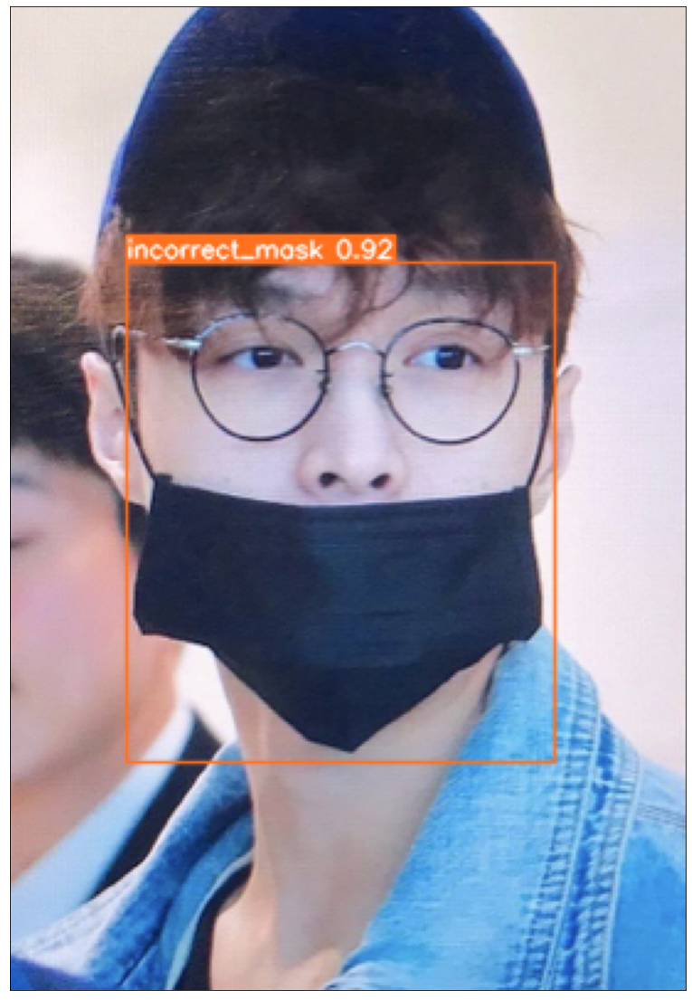

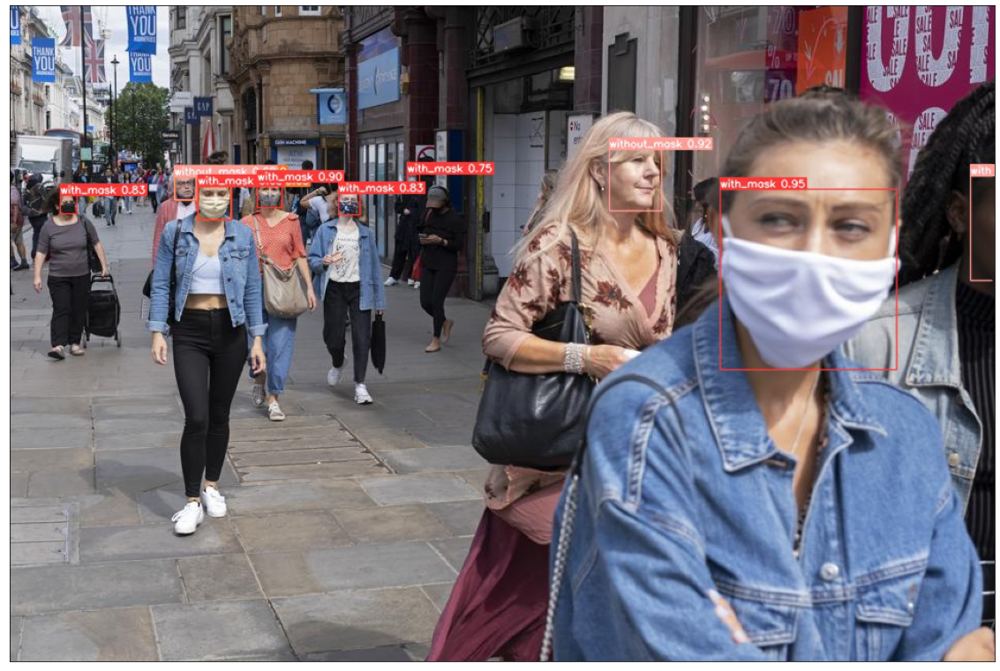

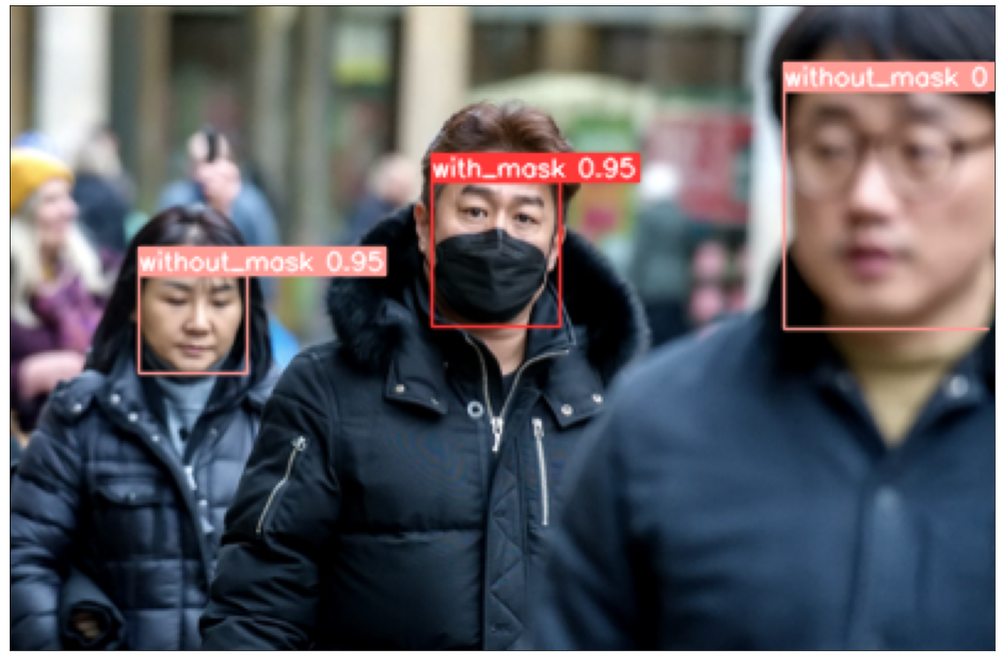

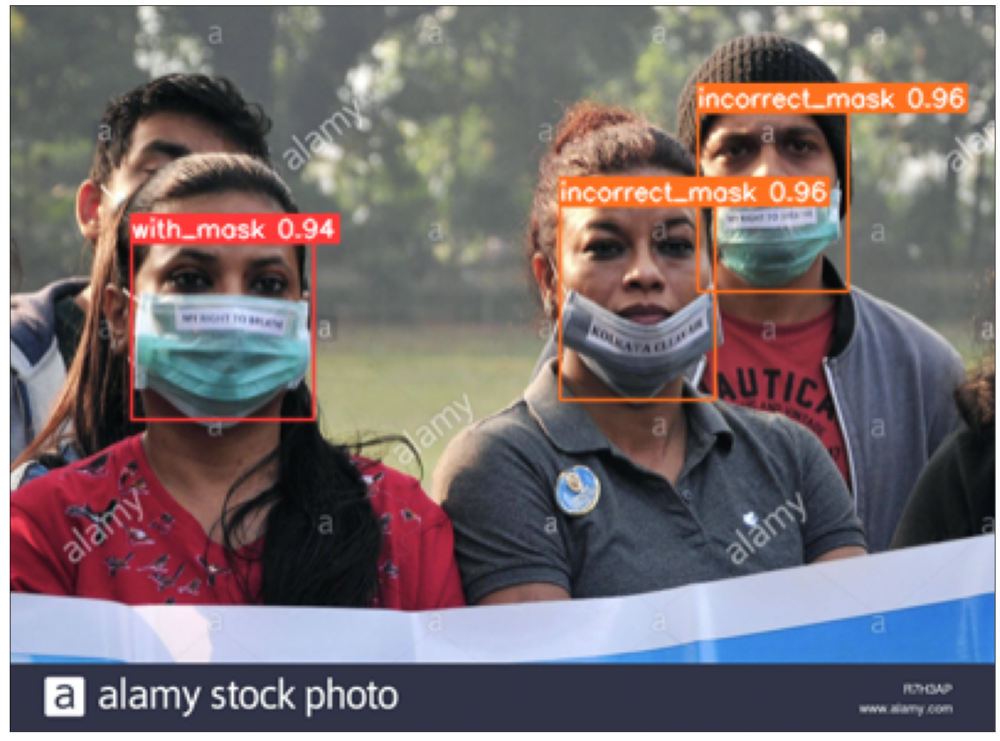

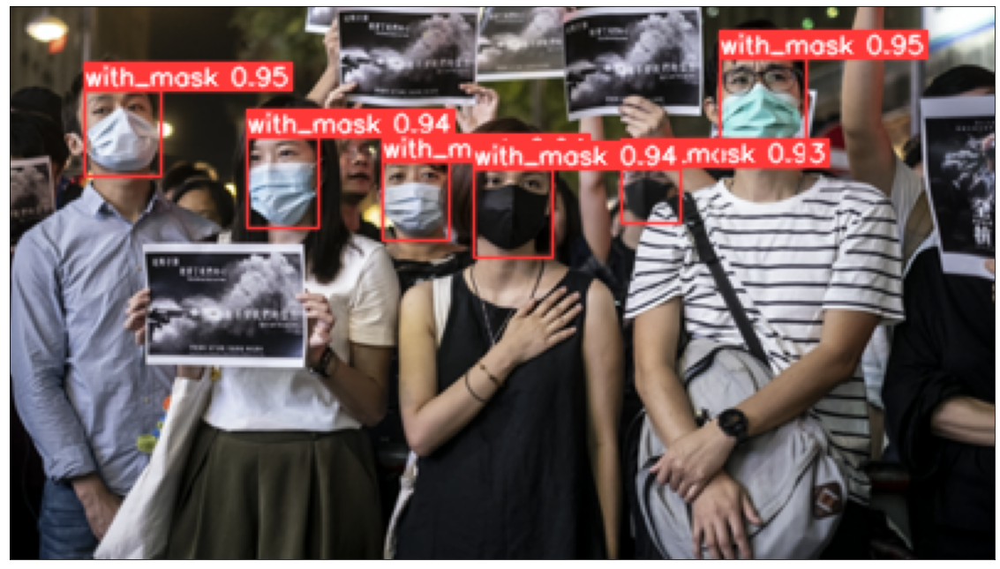

...

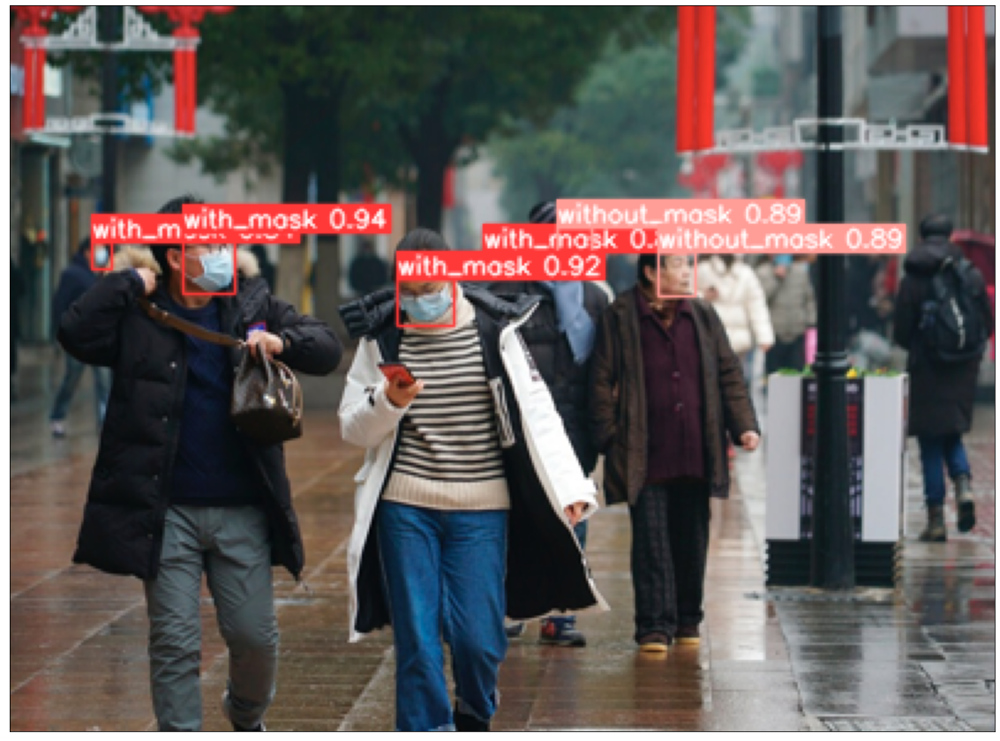

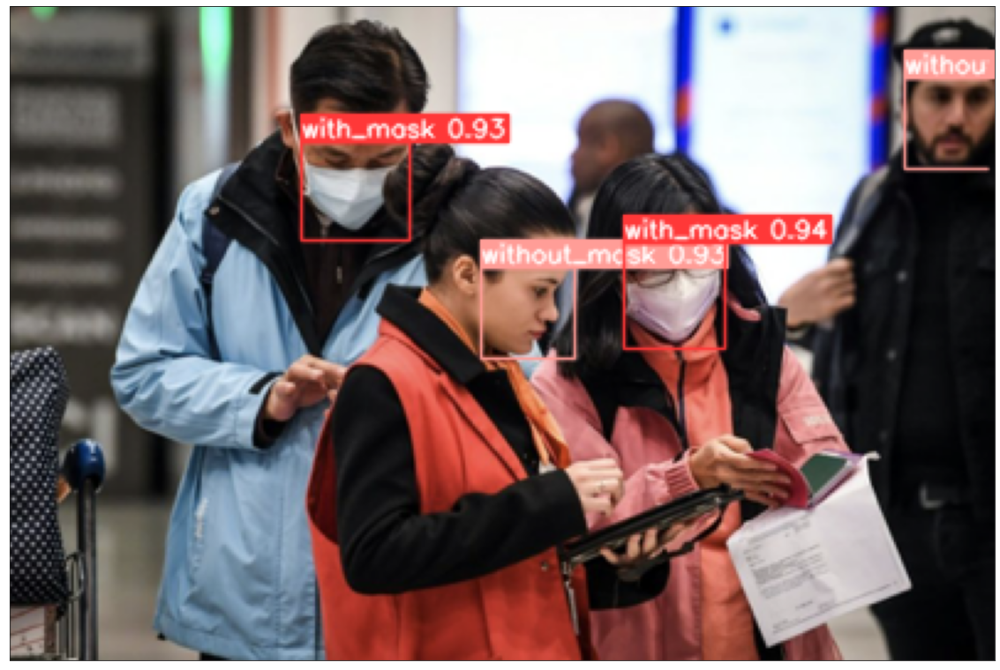

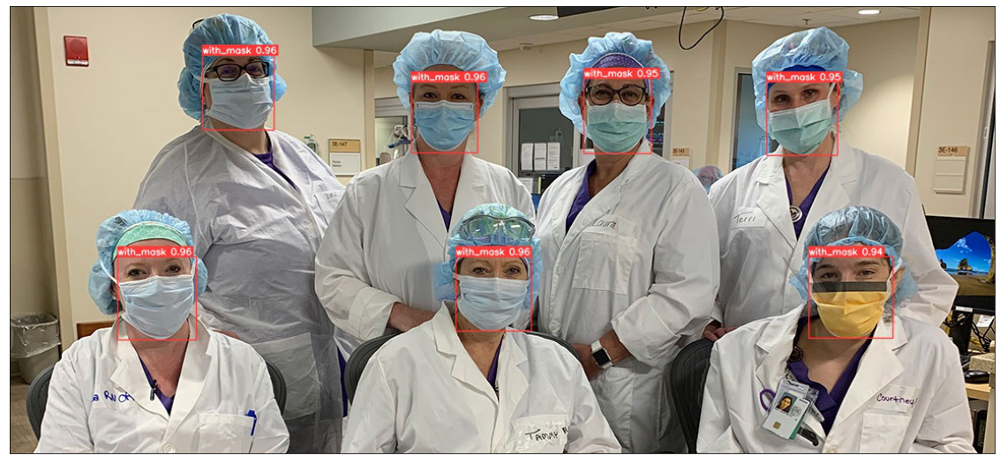

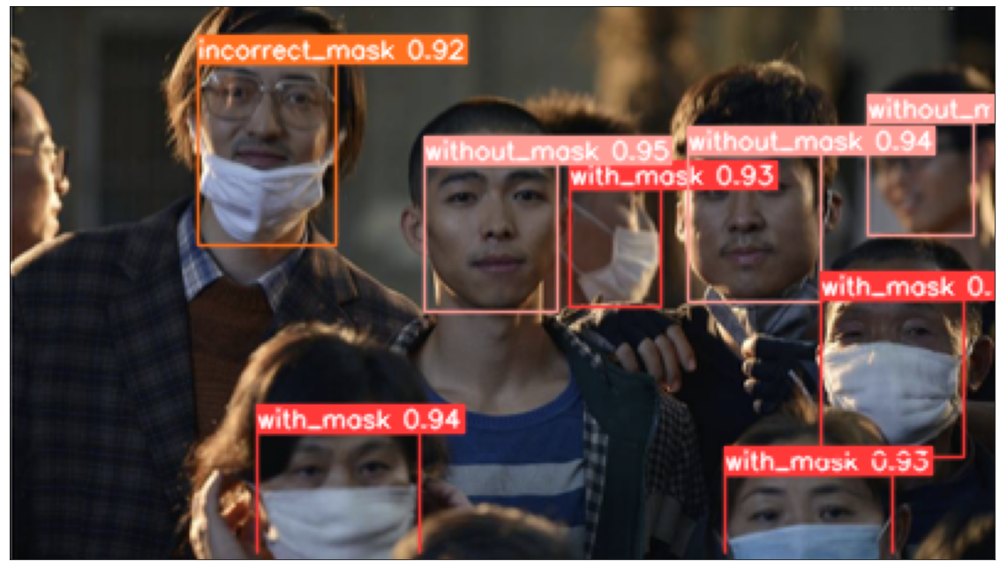

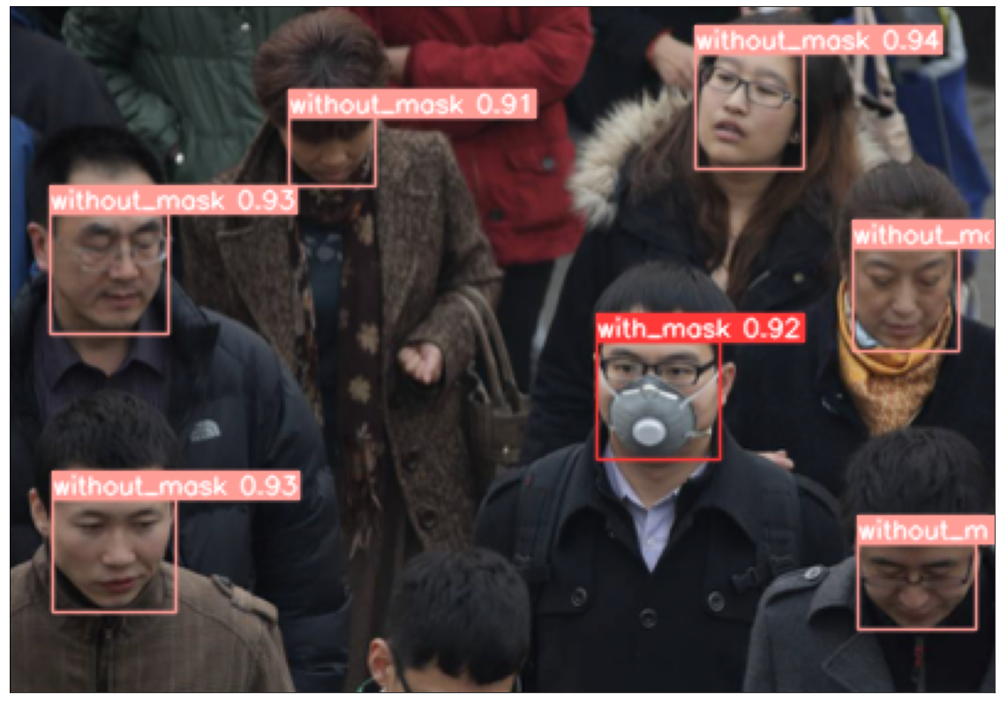

In [ ]:
show_images('runs/detect/exp')

### Plot Metrics in summary plots

In [ ]:
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(context='talk', style="ticks", rc=custom_params)

In [ ]:
results_path = '/content/yolov5/runs/train/exp/results.csv'

In [ ]:
data = pd.read_csv('/content/yolov5/runs/train/exp/results.csv')

In [ ]:
print(data.columns)

Index(['               epoch', '      train/box_loss', '      train/obj_loss',
       '      train/cls_loss', '   metrics/precision', '      metrics/recall',
       '     metrics/mAP_0.5', 'metrics/mAP_0.5:0.95', '        val/box_loss',
       '        val/obj_loss', '        val/cls_loss', '               x/lr0',
       '               x/lr1', '               x/lr2'],
      dtype='object')


In [ ]:
cols = [x.strip() for x in data.columns]

In [ ]:
data.columns = cols

In [ ]:
data.columns

Index(['epoch', 'train/box_loss', 'train/obj_loss', 'train/cls_loss',
       'metrics/precision', 'metrics/recall', 'metrics/mAP_0.5',
       'metrics/mAP_0.5:0.95', 'val/box_loss', 'val/obj_loss', 'val/cls_loss',
       'x/lr0', 'x/lr1', 'x/lr2'],
      dtype='object')

In [ ]:
data.drop(['x/lr0', 'x/lr1', 'x/lr2'], axis=1, inplace = True)

In [ ]:
new_cols = ['Epoch', 'Train_Box_Loss', 'Train_Obj_Loss', 'Train_Cls_Loss',
            'Precision', 'Recall', 'Precision (mAP: 0.5)','Precision (mAP: 0.5:0.95)', 
            'Val_Box_Loss', 'Val_Obj_Loss', 'Val_Cls_Loss']

In [ ]:
data.columns = new_cols

In [ ]:
data.columns

Index(['Epoch', 'Train_Box_Loss', 'Train_Obj_Loss', 'Train_Cls_Loss',
       'Precision', 'Recall', 'Precision (mAP: 0.5)',
       'Precision (mAP: 0.5:0.95)', 'Val_Box_Loss', 'Val_Obj_Loss',
       'Val_Cls_Loss'],
      dtype='object')

In [ ]:
data.head()

,Epoch,Train_Box_Loss,Train_Obj_Loss,Train_Cls_Loss,Precision,Recall,Precision (mAP: 0.5),Precision (mAP: 0.5:0.95),Val_Box_Loss,Val_Obj_Loss,Val_Cls_Loss
0,0,0.101630,0.057447,0.032698,0.72307,0.071642,0.029979,0.006379,0.086010,0.049979,0.027133
1,1,0.085475,0.044366,0.018675,0.70701,0.159880,0.036197,0.008083,0.085309,0.030058,0.024504
2,2,0.080977,0.039423,0.017845,0.73590,0.123380,0.051890,0.010014,0.085428,0.029707,0.021845
3,3,0.072185,0.038703,0.016003,0.63890,0.355980,0.308940,0.085816,0.058189,0.032753,0.013644
4,4,0.056729,0.032691,0.010866,0.87056,0.392720,0.511220,0.225530,0.046946,0.026872,0.013176


In [ ]:
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(context='talk', style="ticks", rc=custom_params)

In [ ]:
# Function to plot Loss
def loss_plot(x,y1,y2,title):
  fig = plt.figure(figsize=(10, 6))
  plt.plot(x, y1, label='Training Loss')
  plt.plot(x, y2, label='Val Loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.title(title, y=1.05)
  plt.legend(loc='upper right')
  plt.grid(linestyle='-', linewidth=0.5)
  #plt.ylim([0.8, 1.01]); plt.xlim([0, 22]);
  plt.xlim(left = 0)
  plt.show()

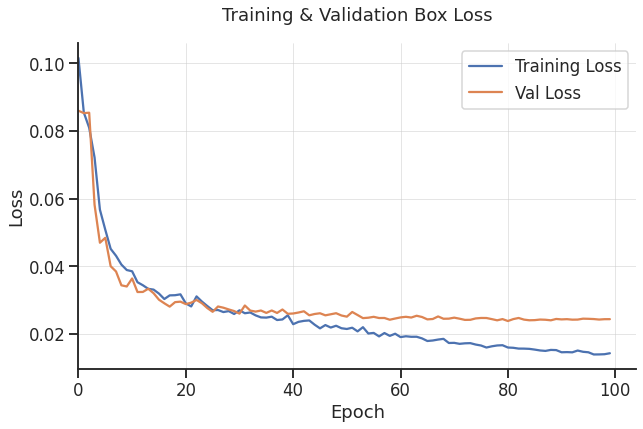

In [ ]:
title = 'Training & Validation Box Loss'
x = data['Epoch']; y1 = data['Train_Box_Loss']; y2 = data['Val_Box_Loss'];
loss_plot(x,y1,y2,title)

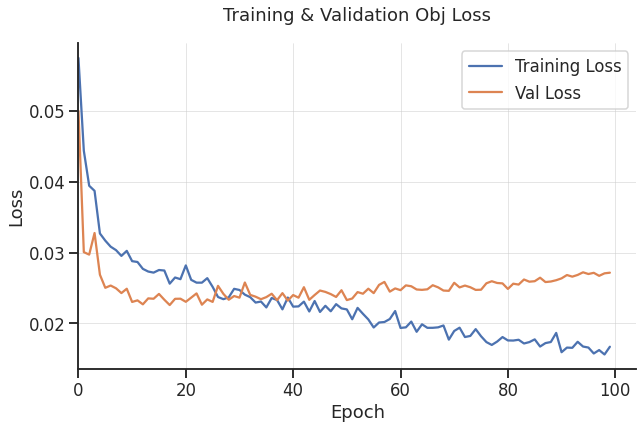

In [ ]:
title = 'Training & Validation Obj Loss'
x = data['Epoch']; y1 = data['Train_Obj_Loss']; y2 = data['Val_Obj_Loss'];
loss_plot(x,y1,y2,title)

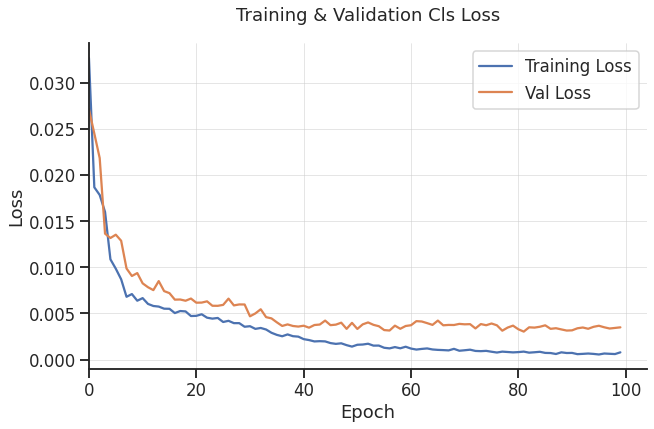

In [ ]:
title = 'Training & Validation Cls Loss'
x = data['Epoch']; y1 = data['Train_Cls_Loss']; y2 = data['Val_Cls_Loss'];
loss_plot(x,y1,y2,title)

In [ ]:
data.columns

Index(['Epoch', 'Train_Box_Loss', 'Train_Obj_Loss', 'Train_Cls_Loss',
       'Precision', 'Recall', 'Precision (mAP: 0.5)',
       'Precision (mAP: 0.5:0.95)', 'Val_Box_Loss', 'Val_Obj_Loss',
       'Val_Cls_Loss'],
      dtype='object')

In [ ]:
def Precision_plot(x,y1,y2,y3,y4,title): 
  fig = plt.figure(figsize=(10, 6))
  plt.plot(x, y1, label='Precision')
  plt.plot(x, y2, label='mAP @ IoU: 0.5')
  plt.plot(x, y3, label='mAP @ IoU: 0.5:0.95')
  plt.plot(x, y4, label='Recall')
  plt.ylabel('Precision/Recall')
  plt.xlabel('Epoch')
  plt.title(title, y=1.05)
  plt.legend(loc='lower right')
  plt.grid(linestyle='-', linewidth=0.5)
  #plt.ylim([0.8, 1.01]); plt.xlim([0, 22]);
  plt.xlim(left = 0)
  plt.show()

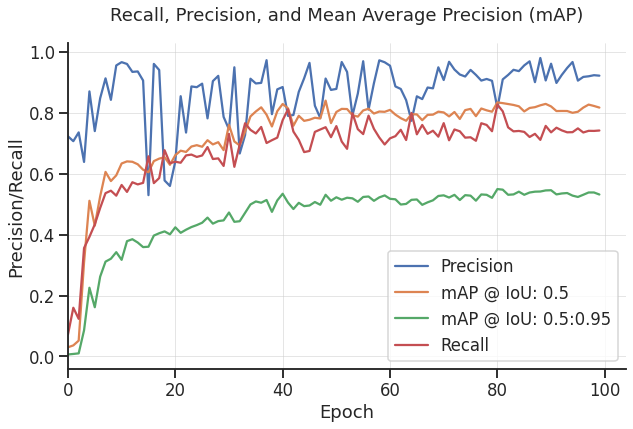

In [ ]:
title = 'Recall, Precision, and Mean Average Precision (mAP)'
x = data['Epoch']; y1 = data['Precision']; y2 = data['Precision (mAP: 0.5)']; y3 = data['Precision (mAP: 0.5:0.95)']; y4 = data['Recall'];
Precision_plot(x,y1,y2,y3,y4,title)